<div style="background-color:#B4DBE9; color:#636363;">
    <h1><center>Introduction - Crypto Forecasting</center></h1>
</div>

<div style="background-color:#B4DBE9; color:#636363;">
    <h1><center> Amazon </center></h1>
</div>


<div style="background-color:#B4DBE9;">
    <center><img src="https://d32ijn7u0aqfv4.cloudfront.net/wp/wp-content/uploads/raw/cryptocurrency-coins_SOIN19158_927053734_is_1560x880.jpg">
</div>
    


<font size="3"> Crypto, a form of digital token or “coins” that exist on a distributed and decentralized ledger called a blockchain, is a popular investment nowadays.

A crypto is a collection of binary data which is designed to work as a medium of exchange. Individual coin ownership records are stored in a ledger, which is a computerized database using strong cryptography to secure transaction records, to control the creation of additional coins, and to verify the transfer of coin ownership.
    
     
Over $40 billion worth of cryptocurrencies are traded every day. 
They are among the most popular assets for speculation and investment, yet have proven wildly volatile. Fast-fluctuating prices have made millionaires of a lucky few, and delivered crushing losses to others. Could some of these price movements have been predicted in advance?</font>    
    


<div style="background-color:#B4DBE9; color:#636363;">
    <h1><center>Feature Description</center></h1>
</div>

### Train.csv - The training set

**timestamp** - All timestamps are returned as second Unix timestamps (the number of seconds elapsed since 1970-01-01 00:00:00.000 UTC). Timestamps in this dataset are multiple of 60, indicating minute-by-minute data.

**Asset_ID** - The asset ID corresponding to one of the crytocurrencies (e.g. Asset_ID = 1 for Bitcoin). The mapping from Asset_ID to crypto asset is contained in asset_details.csv.

**Count** - The number of trades that took place this minute.

**Open** - The USD price at the beginning of the minute.

**High** - The highest USD price during the minute.

**Low** - The lowest USD price during the minute.

**Close** - The USD price at the end of the minute.

**Volume** - The number of cryptoasset units traded during the minute.

**VWAP** - The volume weighted average price for the minute.

**Target** - 15 minute residualized returns(log returns)


**asset_details.csv** - Provides the real name and of the cryptoasset for each Asset_ID and the weight each cryptoasset receives in the metric

The first two columns define the time and asset indexes for this data row. The 6 middle columns are feature columns with the trading data for this asset and minute in time. The last column is the prediction target, which we will get to later in more detail.

## Libraries

In [142]:
#imoprting libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import cufflinks as cf
cf.go_offline()


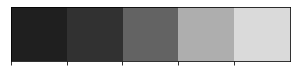

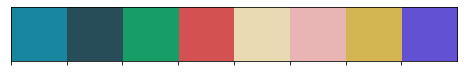

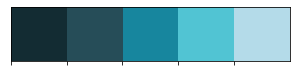

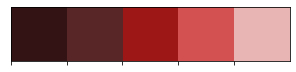

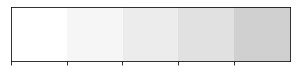

In [182]:
colors_dark = ["#1F1F1F", "#313131", '#636363', '#AEAEAE', '#DADADA']
colors_mix = ["#17869E", '#264D58', '#179E66', '#D35151', '#E9DAB4', '#E9B4B4', '#D3B651', '#6351D3']
colors_blue = ["#132C33", "#264D58", '#17869E', '#51C4D3', '#B4DBE9']
colors_red = ["#331313", "#582626", '#9E1717', '#D35151', '#E9B4B4']
colors_white = ["#ffffff","#f6f6f6","#ececec","#e1e1e1","#d0d0d0"]

sns.palplot(colors_dark)
sns.palplot(colors_mix)
sns.palplot(colors_blue)
sns.palplot(colors_red)
sns.palplot(colors_white) 

In [6]:
#reading the dataset

data = pd.read_csv('train.csv')

In [7]:
data.head(10)

,timestamp,Asset_ID,Count,Open,High,Low,Close,Volume,VWAP,Target
0,1514764860,2,40.0,2376.580000,2399.5000,2357.1400,2374.590000,19.233005,2373.116392,-0.004218
1,1514764860,0,5.0,8.530000,8.5300,8.5300,8.530000,78.380000,8.530000,-0.014399
2,1514764860,1,229.0,13835.194000,14013.8000,13666.1100,13850.176000,31.550062,13827.062093,-0.014643
3,1514764860,5,32.0,7.659600,7.6596,7.6567,7.657600,6626.713370,7.657713,-0.013922
4,1514764860,7,5.0,25.920000,25.9200,25.8740,25.877000,121.087310,25.891363,-0.008264
5,1514764860,6,173.0,738.302500,746.0000,732.5100,738.507500,335.987856,738.839291,-0.004809
6,1514764860,9,167.0,225.330000,227.7800,222.9800,225.206667,411.896642,225.197944,-0.009791
7,1514764860,11,7.0,329.090000,329.8800,329.0900,329.460000,6.635710,329.454118,NaN
8,1514764920,2,53.0,2374.553333,2400.9000,2354.2000,2372.286667,24.050259,2371.434498,-0.004079
9,1514764920,0,7.0,8.530000,8.5300,8.5145,8.514500,71.390000,8.520215,-0.015875


In [9]:
#shape of the data

data.shape

(24236806, 10)

#### dataset have 24 million records with 10 columns

In [10]:
# Features of the dataset 
data.columns

Index(['timestamp', 'Asset_ID', 'Count', 'Open', 'High', 'Low', 'Close',
       'Volume', 'VWAP', 'Target'],
      dtype='object')

In [11]:
#information of the dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24236806 entries, 0 to 24236805
Data columns (total 10 columns):
 #   Column     Dtype  
---  ------     -----  
 0   timestamp  int64  
 1   Asset_ID   int64  
 2   Count      float64
 3   Open       float64
 4   High       float64
 5   Low        float64
 6   Close      float64
 7   Volume     float64
 8   VWAP       float64
 9   Target     float64
dtypes: float64(8), int64(2)
memory usage: 1.8 GB


All the features in the dataset are numericals and there are no categorical columns in the dataset

In [15]:
#Summary statistics for the data
data.describe(include = 'all').style.applymap(lambda x : "background-color: #B4DBE9")

,timestamp,Asset_ID,Count,Open,High,Low,Close,Volume,VWAP,Target
count,24236806.000000,24236806.000000,24236806.000000,24236806.000000,24236806.000000,24236806.000000,24236806.000000,24236806.000000,24236797.000000,23486468.000000
mean,1577120425.312500,6.292544,286.459348,1432.640492,1436.350391,1429.567599,1432.639977,286852.985610,nan,0.000007
std,33233501.742110,4.091861,867.398158,6029.605020,6039.482419,6020.260688,6029.610647,2433934.645922,nan,0.005679
min,1514764860.000000,0.000000,1.000000,0.001170,0.001195,0.000200,0.001171,-0.366281,-inf,-0.509351
25%,1549011480.000000,3.000000,19.000000,0.267650,0.268160,0.266900,0.267648,141.072477,0.267637,-0.001694
50%,1578371880.000000,6.000000,64.000000,14.288600,14.312500,14.263000,14.289200,1295.414556,14.287687,-0.000043
75%,1606197540.000000,9.000000,221.000000,228.874286,229.300000,228.420000,228.872857,27297.640092,228.872798,0.001602
max,1632182400.000000,13.000000,165016.000000,64805.943750,64900.000000,64670.530000,64808.537275,759755403.142386,inf,0.964170


In [189]:
data.min()

Asset_ID    Binance Coin
Count                  1
Open           0.0011704
High            0.001195
Low               0.0002
Close          0.0011714
Volume         -0.366281
VWAP                -inf
Target         -0.509351
dtype: object

In [17]:
#checking the duplicate values

data.duplicated().sum()

0

every asset id is assigned to differernt crypto coin, let's name the asset_id to given assent_names in the assessment data

In [18]:
#reading asset data set and get the names of asset names with respect to asset id
asset_data = pd.read_csv('asset_details.csv')

In [19]:
asset_data

,Asset_ID,Weight,Asset_Name
0,2,2.397895,Bitcoin Cash
1,0,4.304065,Binance Coin
2,1,6.779922,Bitcoin
3,5,1.386294,EOS.IO
4,7,2.079442,Ethereum Classic
5,6,5.894403,Ethereum
6,9,2.397895,Litecoin
7,11,1.609438,Monero
8,13,1.791759,TRON
9,12,2.079442,Stellar


<AxesSubplot:xlabel='Asset_Name', ylabel='Weight'>

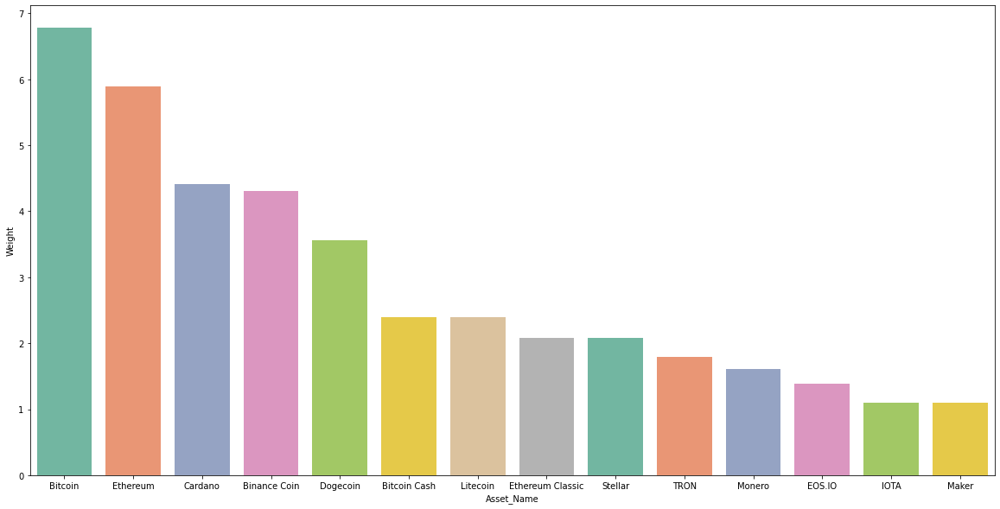

In [49]:
#let's visualize how the weights are distributed
plt.subplots(figsize=(20,10))
sns.barplot(x='Asset_Name', y='Weight',
            data=asset_data.sort_values(by=['Weight'],ascending=False),palette='Set2')

In [60]:
#printing the individual assest name
asset_names = [name for name in asset_data['Asset_Name']]
asset_names

['Bitcoin Cash',
 'Binance Coin',
 'Bitcoin',
 'EOS.IO',
 'Ethereum Classic',
 'Ethereum',
 'Litecoin',
 'Monero',
 'TRON',
 'Stellar',
 'Cardano',
 'IOTA',
 'Maker',
 'Dogecoin']

In [50]:
#checking how many unique asset_ids in the dataset
data['Asset_ID'].unique()

array([ 2,  0,  1,  5,  7,  6,  9, 11, 13, 12,  3,  8, 10,  4])

In [52]:

asset_name = ['Binance Coin', 'Bitcoin', 'Bitcoin Cash', 'Cardano', 'Dogecoin', 'EOS.IO',
              'Ethereum','Ethereum Classic', 'IOTA', 'Litecoin', 'Maker', 'Monero', 
              'Stellar', 'TRON']

for index in range(0,14):
    data['Asset_ID'].replace({index : asset_name[index]}, inplace=True)
    
names = data.Asset_ID.unique()
names


array(['Bitcoin Cash', 'Binance Coin', 'Bitcoin', 'EOS.IO',
       'Ethereum Classic', 'Ethereum', 'Litecoin', 'Monero', 'TRON',
       'Stellar', 'Cardano', 'IOTA', 'Maker', 'Dogecoin'], dtype=object)

In [54]:
data.head()

,timestamp,Asset_ID,Count,Open,High,Low,Close,Volume,VWAP,Target
0,1514764860,Bitcoin Cash,40.0,2376.5800,2399.5000,2357.1400,2374.5900,19.233005,2373.116392,-0.004218
1,1514764860,Binance Coin,5.0,8.5300,8.5300,8.5300,8.5300,78.380000,8.530000,-0.014399
2,1514764860,Bitcoin,229.0,13835.1940,14013.8000,13666.1100,13850.1760,31.550062,13827.062093,-0.014643
3,1514764860,EOS.IO,32.0,7.6596,7.6596,7.6567,7.6576,6626.713370,7.657713,-0.013922
4,1514764860,Ethereum Classic,5.0,25.9200,25.9200,25.8740,25.8770,121.087310,25.891363,-0.008264


### checking Null vaules

In [56]:
data.isnull().sum()

timestamp         0
Asset_ID          0
Count             0
Open              0
High              0
Low               0
Close             0
Volume            0
VWAP              9
Target       750338
dtype: int64

In [58]:
#printing the %of null values in the dataset
print("Total Null Target Rows = " ,data["Target"].isnull().sum())
print("Percentage of NUll rows in Training Data = {:.2f}%".format(data["Target"].isnull().sum()*100 / data.shape[0] ))

Total Null Target Rows =  750338
Percentage of NUll rows in Training Data = 3.10%


### Data Distribution 

Checking the data distribution of each crypto asset

In [73]:
#counting the number of data points and plotting those points   
asset_count = {}
for i in asset_names:
    count = (data['Asset_ID']==i).sum()
    asset_count[i] = count
Distribution = pd.DataFrame(asset_count.items(),columns = ['Assets','No of data points'])


[1953537,
 1942619,
 1956282,
 1955140,
 1951127,
 1956200,
 1956030,
 1701261,
 1874560,
 1778749,
 1791867,
 1592071,
 670497,
 1156866]

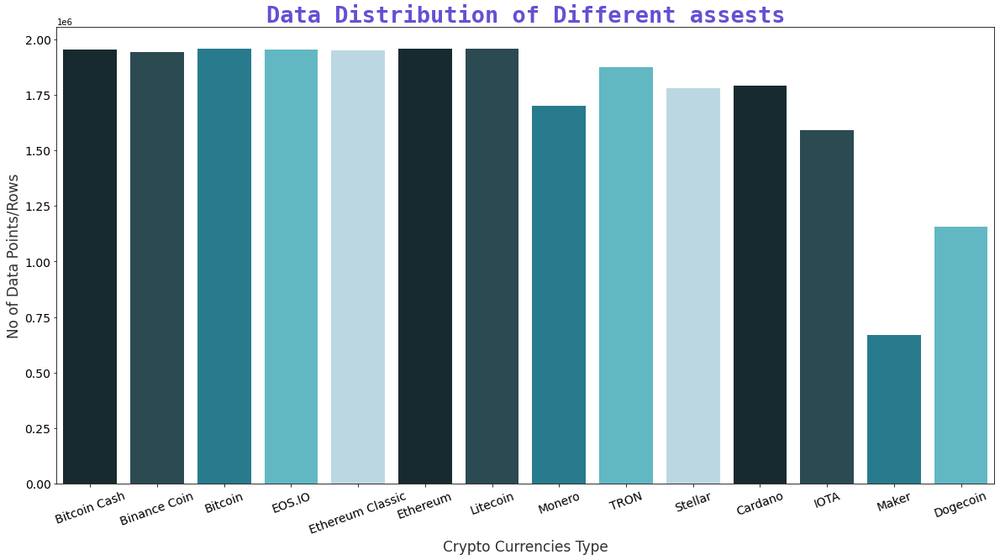

In [121]:
#plotting the data
plt.subplots(figsize=(20,10))
fig = sns.barplot(x="Assets", y="No of data points", data=Distribution,palette=colors_blue)
fig.set_title('Data Distribution of Different assests',fontdict={'color':colors_mix[7],'size':27,
                                       'fontweight':'bold','fontname':'monospace'})
fig.set_xlabel('Crypto Currencies Type',fontsize=17)
fig.set_ylabel('No of Data Points/Rows',fontsize=17)
fig.xaxis.label.set_color(colors_dark[1])
fig.yaxis.label.set_color(colors_dark[1])
plt.xticks(fontsize=14,rotation=20)
plt.yticks(fontsize=14)
plt.show()

In [133]:
#Making timestamp column the index
data['timestamp'] = pd.to_datetime(data['timestamp'],unit='s')
data.set_index('timestamp',inplace=True)
data.index.dtype 


dtype('<M8[ns]')

In [135]:
#let's make a separate dataframes to analyse the data

Bitcoin_cash = data[data['Asset_ID'] == 'Bitcoin Cash']
Binance_coin = data[data['Asset_ID'] == 'Binance Coin']
Bitcoin = data[data['Asset_ID'] == 'Bitcoin']
Eos_io = data[data['Asset_ID'] == 'EOS.IO']
Ethereum_classic = data[data['Asset_ID'] == 'Ethereum Classic']
Ethereum = data[data['Asset_ID'] == 'Ethereum']
Litecoin = data[data['Asset_ID'] == 'Litecoin']
Monero = data[data['Asset_ID'] == 'Monero']
Tron = data[data['Asset_ID'] == 'TRON']
Stellar = data[data['Asset_ID'] == 'Stellar']
Cardano = data[data['Asset_ID'] == 'Cardano']
Iota = data[data['Asset_ID'] == 'IOTA']
Maker = data[data['Asset_ID'] == 'Maker']
Dogecoin = data[data['Asset_ID'] == 'Dogecoin']


Resampling generates a unique sampling distribution on the basis of the actual data.
We can apply various frequency to resample our time series data. 
This is a very important technique in the field of analytics.

Most commonly used time series frequency are – <br>
W : weekly frequency<br>
M : month end frequency<br>
SM : semi-month end frequency (15th and end of month)<br>
Q : quarter end frequency<br>
There are many other types of time series frequency available. 

In [137]:
#let's resample all datasets

In [139]:
# Resampling all datasets

day = {
    'Open': 'first',
    'High': 'max',
    'Low': 'min',
    'Close': 'last',
    'Volume': 'sum'
}

bitcoin_cash = Bitcoin_cash.resample('D').apply(day)
binance_coin = Binance_coin.resample('D').apply(day)
bitcoin = Bitcoin.resample('D').apply(day)
eos_io = Eos_io.resample('D').apply(day)
ethereum_classic = Ethereum_classic.resample('D').apply(day)
ethereum = Ethereum.resample('D').apply(day)
litecoin = Litecoin.resample('D').apply(day)
monero = Monero.resample('D').apply(day)
tron = Tron.resample('D').apply(day)
stellar = Stellar.resample('D').apply(day)
cardano = Cardano.resample('D').apply(day)
iota = Iota.resample('D').apply(day)
maker = Maker.resample('D').apply(day)
dogecoin = Dogecoin.resample('D').apply(day)

df_list = [bitcoin_cash, binance_coin, bitcoin, eos_io, ethereum_classic, ethereum,
           litecoin, monero, tron, stellar, cardano, iota, maker, dogecoin]

In [140]:
bitcoin_cash.head()

,Open,High,Low,Close,Volume
timestamp,,,,,
2018-01-01,2376.580000,2444.0,2241.3,2321.520000,23301.798663
2018-01-02,2320.886667,2745.5,2207.4,2555.440000,58366.493060
2018-01-03,2553.570000,2789.0,2501.0,2553.175000,44169.792774
2018-01-04,2558.480000,2577.1,2294.8,2358.246667,54649.564027
2018-01-05,2358.280000,2530.9,2282.0,2388.633333,57067.271005


In [163]:
date_buttons = [
{'count':  4, 'step': "year", 'stepmode': "todate", 'label': "Year"},
{'count':  6, 'step': "month", 'stepmode': "todate", 'label': "Month"},
{'count': 60, 'step': "day", 'stepmode': "todate", 'label': "Week"},
{'count': 20, 'step': "day", 'stepmode': "todate", 'label': "Day"},
               ]

buttons = []
i = 0
vis = [False] * 14
for df in df_list:
    vis[i] = True
    buttons.append({ 'label' : names[i],
                     'method' : 'update',
                     'args'   : [{'visible' : vis},
                                 {'title'  : names[i] + ' Chart'}] })
    i+=1
    vis = [False] * 14

fig = go.Figure()

for df in df_list:
    fig.add_trace(go.Candlestick(x     = df.index,
                                 open  = df['Open'],
                                 high  = df['High'],
                                 low   = df['Low'],
                                 close = df['Close'],
                                 increasing_line_color= colors_white[1],
                                 decreasing_line_color= colors_mix[3]))

fig.update_xaxes(
        tickfont = dict(size=15, family = 'monospace', color=colors_white[1]),
        tickmode = 'array',
        ticklen = 6,
        showline = False,
        showgrid = True,
        gridcolor = '#595959',
        ticks = 'outside')

fig.update_yaxes(
        tickfont = dict(size=15, family = 'monospace', color=colors_white[1]),
        tickmode = 'array',
        showline = False,
        ticksuffix = '$',
        showgrid = True,
        gridcolor = '#595959',
        ticks = 'outside')    
    
    
fig.update_layout(height = 650,
                  font_family   = 'monospace',
                  xaxis         = dict(rangeselector = dict(buttons = date_buttons)),
                  updatemenus   = [dict(type = 'dropdown',
                                        x = 1,
                                        y = 1.15,
                                        showactive = True,
                                        active = 2,
                                        buttons = buttons)],
                  title         = dict(text = 'Cryptocurrency Candlestick<br>Dashboard',
                                       font = dict(color = colors_white[1]), 
                                       x = 0.525),
                  plot_bgcolor  = colors_mix[1],
                  paper_bgcolor = colors_mix[1],
                  font          = dict(color='#858585'), 
                  annotations   = [
                                  dict( text = "<b>Choose<br>Crypto<b> : ",
                                        font = dict(size = 12),
                                        showarrow=False,
                                        x = 0.96, y = 1.25,
                                        xref = 'paper', yref = "paper",
                                        align = "left")])
    
    
for i in range(0,14):
    fig.data[i].visible = False
fig.data[2].visible = True

fig.show()

In [169]:
date_buttons = [
{'count':  4, 'step': "year", 'stepmode': "backward", 'label': "Year"},
{'count':  6, 'step': "month", 'stepmode': "todate", 'label': "Month"},
{'count': 60, 'step': "day", 'stepmode': "todate", 'label': "Week"},
{'count': 20, 'step': "day", 'stepmode': "todate", 'label': "Day"},
               ]

fig = make_subplots(rows=2, cols=1, shared_xaxes=True, 
               vertical_spacing=0.3, subplot_titles=('', 'Volume'), row_width=[0.3, 0.8])


buttons = []
i = 0
vis = [False] * 14

for df in df_list:
    vis[i] = True
    buttons.append({ 'label' : names[i],
                     'method' : 'update',
                     'args'   : [{'visible' : vis},
                                 {'title'  : names[i] + ' Linechart'}] })
    i+=1
    vis = [False] * 14


for df in df_list:
    fig.add_trace(go.Scatter(x = df.index,
                             y = df['Open'],
                             mode = 'lines',
                             marker =  dict(color = colors_white[1])), row=1, col=1)
    
for df in df_list:
    fig.add_trace(go.Bar(x = df.index,
                         y = df['Volume'],
                         marker =  dict(color = colors_white[1])), row=2, col=1)

fig.update_xaxes(
        tickfont = dict(size=15, family = 'monospace', color='#B8B8B8'),
        tickmode = 'array',
        ticklen = 6,
        showline = False,
        showgrid = True,
        gridcolor = '#595959',
        ticks = 'outside')

fig.update_yaxes(
        tickfont = dict(size=15, family = 'monospace', color='#B8B8B8'),
        tickmode = 'array',
        showline = False,
        showgrid = True,
        gridcolor = '#595959',
        ticks = 'outside')    
    
    
fig.update_layout(showlegend = False,
                  height = 650,
                  font_family   = 'monospace',
                  xaxis         = dict(rangeselector = dict(buttons = date_buttons)),
                  updatemenus   = [dict(type = 'dropdown',
                                        x = 1,
                                        y = 1.15,
                                        showactive = True,
                                        active = 0,
                                        buttons = buttons)],
                  title         = dict(text = 'Cryptocurrency Linechart Dashboard<br>with Volumes',
                                       font = dict(color = colors_white[1]), 
                                       x = 0.5),
                  plot_bgcolor  = colors_mix[1],
                  paper_bgcolor = colors_mix[1],
                  font          = dict(color='#858585'),
                  annotations   = [dict(text = "Choose Crypto :",
                                        font = dict(size = 10, color ='#44eff2'),
                                        showarrow=False,
                                        x = 1, y = 1.25,
                                        xref = 'paper', yref = "paper",
                                        align = "left"),                                
                                   dict(text = "<----DRAG HERE TO MOVE---->",
                                        font = dict(size = 10, color =colors_red[3]),
                                        showarrow=False,
                                        x = 0.5, y = 0.45,
                                        xref = 'paper', yref = "paper",
                                        align = "left")])

for i in range(1,14):
    fig.data[i].visible = False

fig.show()

In [179]:
def indicators(df=None, title='Chart', symbol = 'Candlesticks'):
    
    layout1 = cf.Layout(height=1250,
                  font_family   = 'monospace',
                  xaxis         = dict( rangeselector = dict(buttons = date_buttons),
                                        tickfont = dict(size=12, color='#d4d4d4'),
                                        tickmode = 'array',
                                        ticklen = 6,
                                        showline = False,
                                        showgrid = True,
                                        gridcolor = '#595959',
                                        ticks = 'outside'),

                  yaxis         = dict(
                                       tickfont = dict(size=15, color='#d4d4d4'),
                                        tickmode = 'array',
                                        showline = False,
                                        ticksuffix = '$',
                                        showgrid = True,
                                        gridcolor = '#595959',
                                        ticks = 'outside'),

                  title         = dict(text = '{} chart<br>with Indicators'.format(title),
                                       font = dict(color = '#FFFFFF'), 
                                       x = 0.5),
                    
                  legend        = dict(orientation="h",
                                       yanchor="bottom", y=0.92,
                                       xanchor="center", x=0.5),
                                       
                  plot_bgcolor  = colors_mix[1],
                  paper_bgcolor = colors_mix[1],
                  font          = dict(color='#858585'),
                  annotations   = [dict(text = " ",
                                        font = dict(size = 1, color ='white'),
                                        showarrow=False,
                                        x = 1, y = 1.25,
                                        xref = 'paper', yref = "paper",
                                        align = "left"),                                
                                   dict(text = "RSI",
                                        font = dict(size = 15, color ='white'),
                                        showarrow=False,
                                        x = 0.5, y = 0.62,
                                        xref = 'paper', yref = "paper",
                                        align = "left"),
                                   dict(text = "Volume",
                                        font = dict(size = 15, color ='white'),
                                        showarrow=False,
                                        x = 0.5, y = 0.38,
                                        xref = 'paper', yref = "paper",
                                        align = "left"),
                                   dict(text = "MACD",
                                        font = dict(size = 15, color ='white'),
                                        showarrow=False,
                                        x = 0.5, y = 0.14,
                                        xref = 'paper', yref = "paper",
                                        align = "left"),
                                   dict(text = "<-----SLIDER----->",
                                        font = dict(size = 15, color ='white'),
                                        showarrow=False,
                                        x = 0.5, y = -0.06,
                                        xref = 'paper', yref = "paper",
                                        align = "left")]
                       )
    
    qf = cf.QuantFig(df, name = symbol, down_color='red')

    qf.add_sma([100], width=2, color=['white'])

    qf.add_rsi(periods=14, color=colors_red[3])

    qf.add_volume(color='#999999')

    qf.add_macd(color = ['yellow', 'white'])

    qf.add_bollinger_bands(periods=20, boll_std=2 ,colors=['orange','grey'], fill=True)

    qf.iplot(layout = layout1)

In [173]:
#for testing
data_small = data.head(100000)

In [180]:
indicators(bitcoin, title='Bitcoin', symbol='BTC')

In [181]:
indicators(dogecoin, title='Dogecoin', symbol='DOGE')

In [184]:
indicators(ethereum, title='Ethereum', symbol='ETH')

<div style="background-color:#B4DBE9; color:#636363;">
    <h1><center>Thank you </center></h1>
</div>

In [186]:
data.head(100)

,Asset_ID,Count,Open,High,Low,Close,Volume,VWAP,Target
timestamp,,,,,,,,,
2018-01-01 00:01:00,Bitcoin Cash,40.0,2376.580000,2399.5000,2357.1400,2374.590000,19.233005,2373.116392,-0.004218
2018-01-01 00:01:00,Binance Coin,5.0,8.530000,8.5300,8.5300,8.530000,78.380000,8.530000,-0.014399
2018-01-01 00:01:00,Bitcoin,229.0,13835.194000,14013.8000,13666.1100,13850.176000,31.550062,13827.062093,-0.014643
2018-01-01 00:01:00,EOS.IO,32.0,7.659600,7.6596,7.6567,7.657600,6626.713370,7.657713,-0.013922
2018-01-01 00:01:00,Ethereum Classic,5.0,25.920000,25.9200,25.8740,25.877000,121.087310,25.891363,-0.008264
...,...,...,...,...,...,...,...,...,...
2018-01-01 00:12:00,Monero,8.0,327.670000,327.6800,326.7700,326.770000,17.901633,326.990493,NaN
2018-01-01 00:13:00,Bitcoin Cash,38.0,2366.833333,2398.2000,2340.6000,2365.376667,8.981063,2364.424826,-0.000176
2018-01-01 00:13:00,Binance Coin,24.0,8.399100,8.4559,8.3573,8.420000,604.390000,8.413630,-0.007573


In [188]:
data['Volume'].mean()

286852.98560988996